# Face Mask Detection

#### Introduction

This notebook presents a comprehensive approach to building a face mask detection model, starting with the application of a Random Forest classifier as a baseline method. Following the evaluation of the Random Forest model, we will develop a Convolutional Neural Network (CNN) using MobileNetV2 to enhance our detection capabilities. 

Dataset Overview 

The dataset contains images of people with and without masks. The images are divided into two folders: 

- With Mask 

- Without Mask 

## 1. Import library

In [1]:
import os
import random
import numpy as np
import pandas as pd
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import seaborn as sns
from PIL import Image

# TensorFlow and Keras imports
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.models import load_model, Sequential, Model
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, GlobalAveragePooling2D
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.preprocessing.image import load_img, img_to_array, ImageDataGenerator
from tensorflow.keras.optimizers import Adam

# Scikit-learn imports
from sklearn.model_selection import train_test_split
from sklearn.decomposition import PCA
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix, roc_auc_score, roc_curve
from sklearn.ensemble import RandomForestClassifier

## 2. Data Collection 

In [2]:
# load the images wearing mask
# make a list of all the filenames in with_mask folder
data_with_mask = os.listdir('data/with_mask')
# load the images without mask 
# make a list of all the filenames in without_mask folder
data_without_mask = os.listdir('data/without_mask')

In [3]:
# first 5 file names
print(data_with_mask[:5])

['with_mask_1.jpg', 'with_mask_10.jpg', 'with_mask_100.jpg', 'with_mask_1000.jpg', 'with_mask_1001.jpg']


In [4]:
# first 5 file names
print(data_without_mask[:5])

['without_mask_1.jpg', 'without_mask_10.jpg', 'without_mask_100.jpg', 'without_mask_1000.jpg', 'without_mask_1001.jpg']


In [5]:
# count the data with mask and without mask
with_mask_count = len(data_with_mask)
without_mask_count = len(data_without_mask)
# Number of images of both type
print("Number of with mask images: ", with_mask_count)
print("Number of without mask images: ", without_mask_count)

Number of with mask images:  3725
Number of without mask images:  3828


### 2.1 Dataset Summary Table 

In [6]:
with_mask_dir = 'data/with_mask/'
without_mask_dir = 'data/without_mask/'

In [7]:
image_sizes = []

for img_file in data_with_mask + data_without_mask:
    img_path = os.path.join(with_mask_dir if img_file in data_with_mask else without_mask_dir, img_file)
    img = Image.open(img_path)
    image_sizes.append(img.size)  # Store (width, height)

# Convert to a DataFrame for easier analysis
sizes_df = pd.DataFrame(image_sizes, columns=['Width', 'Height'])

summary_data = {
    'Category': ['With Mask', 'Without Mask'],
    'Count': [with_mask_count, without_mask_count],
    'Percentage': [with_mask_count / (with_mask_count + without_mask_count) * 100,
                   without_mask_count / (with_mask_count + without_mask_count) * 100],
    'Avg Width': [sizes_df['Width'].mean() for _ in range(2)],
    'Avg Height': [sizes_df['Height'].mean() for _ in range(2)]
}

summary_df = pd.DataFrame(summary_data)
print(summary_df)

       Category  Count  Percentage  Avg Width  Avg Height
0     With Mask   3725   49.318152  259.64054  268.940421
1  Without Mask   3828   50.681848  259.64054  268.940421


### 2.2 Distribution of Images by Category   

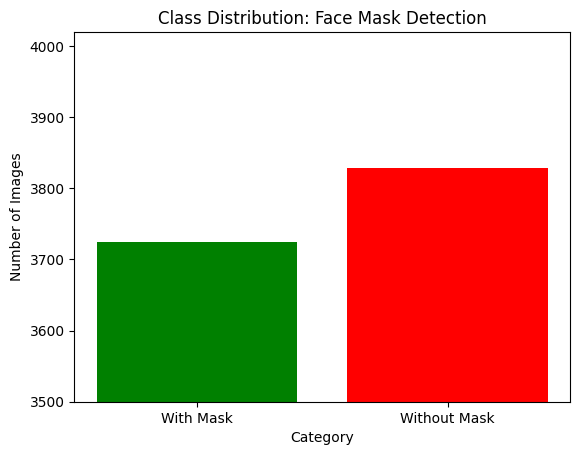

In [8]:
# Plot the distribution
categories = ['With Mask', 'Without Mask']
counts = [with_mask_count, without_mask_count]

plt.bar(categories, counts, color=['green', 'red'])
plt.title('Class Distribution: Face Mask Detection')
plt.xlabel('Category')
plt.ylabel('Number of Images')
plt.ylim(3500)  # start from 3500
plt.show()

### 2.3 Label Data

In [9]:
# label dataset with mask as 0
with_mask_labels = [0]*len(data_with_mask)

# label dataset without mask as 1
without_mask_labels = [1]*len(data_without_mask)

In [10]:
# print first five with mask
print(with_mask_labels[0:5])
# print first five without mask
print(without_mask_labels[0:5])

[0, 0, 0, 0, 0]
[1, 1, 1, 1, 1]


In [11]:
print(len(with_mask_labels))
print(len(without_mask_labels))

3725
3828


In [12]:
# adding both list together
labels = with_mask_labels + without_mask_labels

print(len(labels)) # totalimages
print(labels[0:5]) # first five
print(labels[-5:]) # last five

7553
[0, 0, 0, 0, 0]
[1, 1, 1, 1, 1]


##### Visualize the image with label

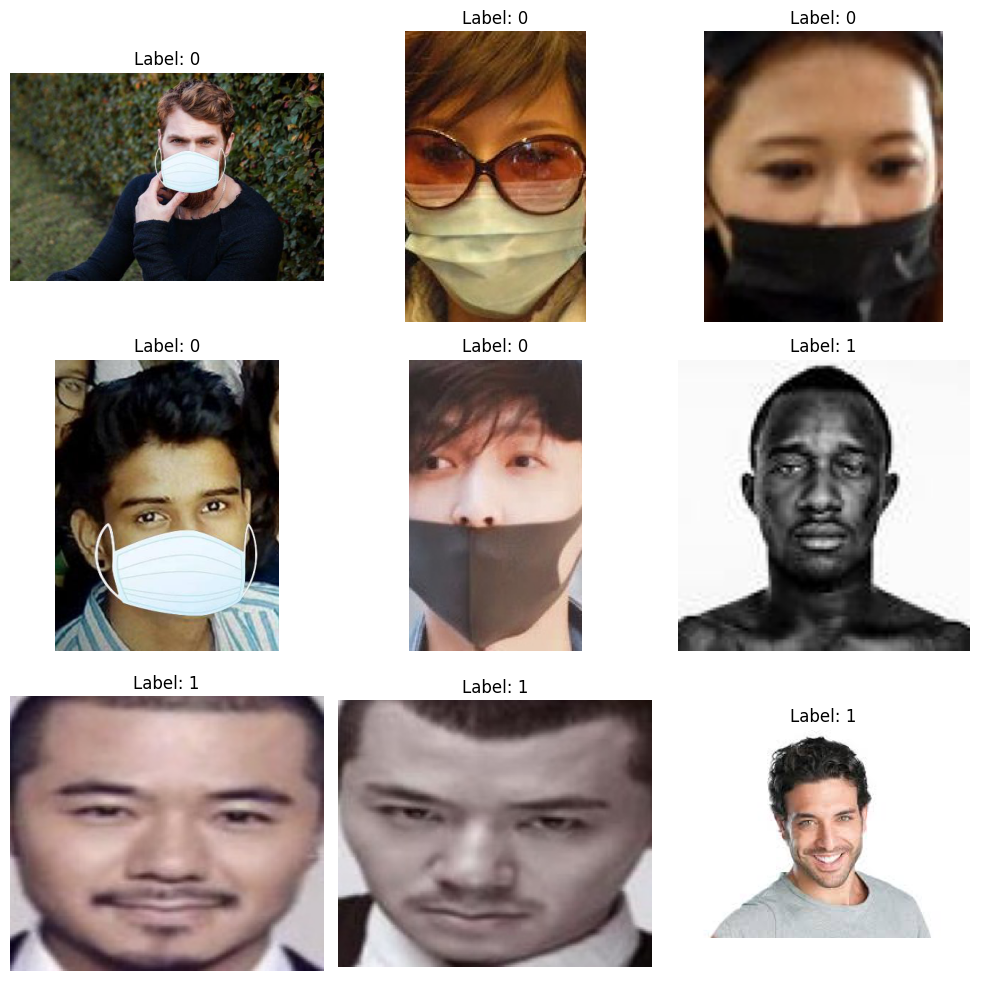

In [13]:
# Visualize a mix of images with numerical labels
plt.figure(figsize=(10, 10))
for i in range(9):  # Display 9 random images
    plt.subplot(3, 3, i + 1)
    
    if i < 5:
        img_file = data_with_mask[i]  # First 5 from with_mask
        img_path = os.path.join(with_mask_dir, img_file)
        img = Image.open(img_path)
        label = 0  # Label for "With Mask"
    else:
        img_file = data_without_mask[i - 5]  # Next 4 from without_mask
        img_path = os.path.join(without_mask_dir, img_file)
        img = Image.open(img_path)
        label = 1  # Label for "Without Mask"
    
    plt.imshow(img)
    plt.title(f'Label: {label}')  # Show numerical label
    plt.axis('off')
plt.tight_layout()
plt.show()

### 2.4 Visualizing Images

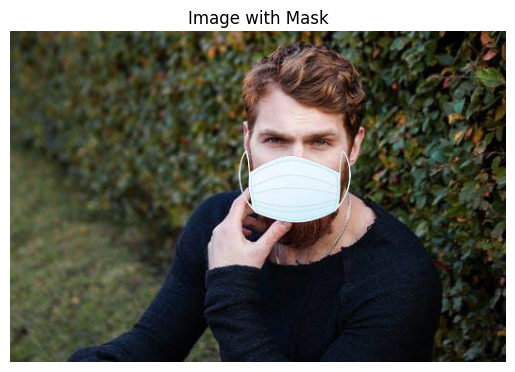

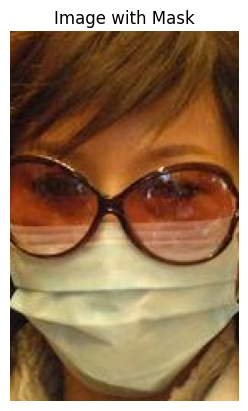

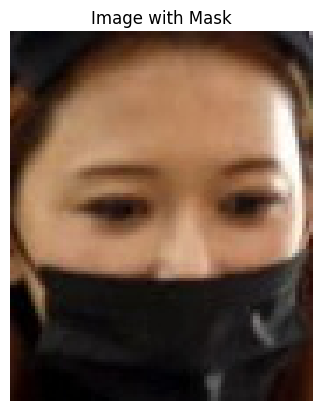

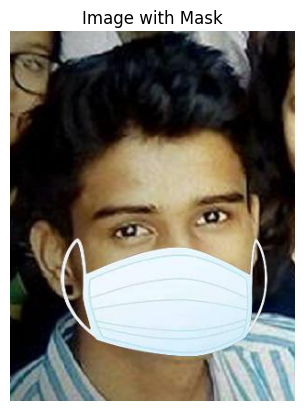

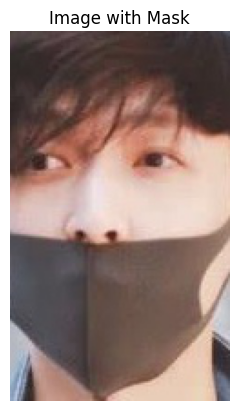

In [14]:
# Print the first five images with mask
for img_file in data_with_mask[:5]:
    img_path = os.path.join(with_mask_dir, img_file)
    img = Image.open(img_path)
    plt.imshow(img)
    plt.title('Image with Mask')
    plt.axis('off')
    plt.show()

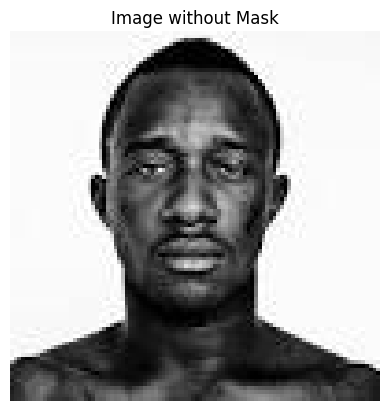

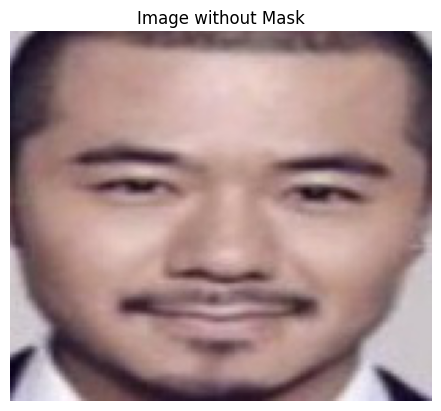

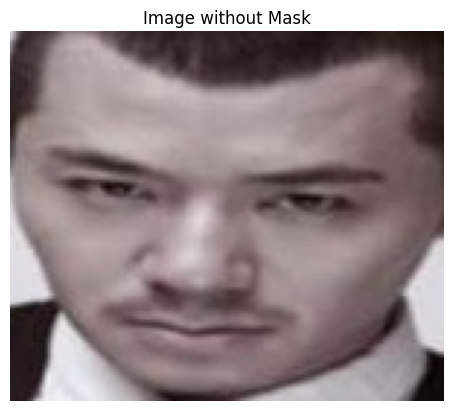

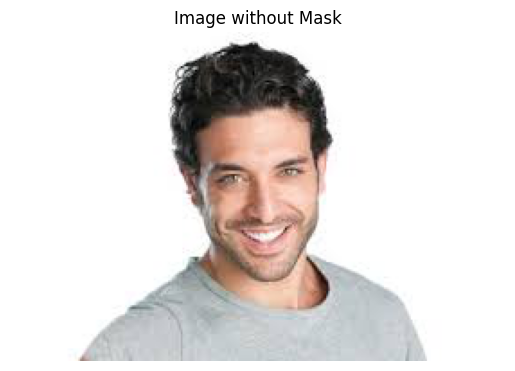

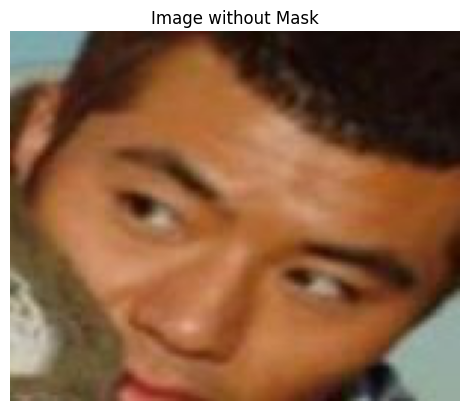

In [15]:
# Print the first five images without mask
for img_file in data_without_mask[:5]:
    img_path = os.path.join(without_mask_dir, img_file)
    img = Image.open(img_path)
    plt.imshow(img)
    plt.title('Image without Mask')
    plt.axis('off')
    plt.show()

## 3. Data Preprocessing 

### 3.1 Image Processing

In [17]:
#resize images and convert to numpy array

images = []  # This will hold all processed images

def load_images(folder):
    processed_images = []  # Temporary list for images in this folder
    for filename in os.listdir(folder):  # Loop through each file in the folder
        # Load the image
        img = Image.open(os.path.join(folder, filename))
        # Resize to 224x224
        img = img.resize((224, 224))
        # Convert to RGB format
        img = img.convert('RGB')
        # Convert to NumPy array and add to the list
        processed_images.append(np.array(img))
    return processed_images


In [18]:
with_mask_images = load_images(with_mask_dir)  # Load 'with_mask' images
without_mask_images = load_images(without_mask_dir)  # Load 'without_mask' images

C:\ProgramData\anaconda3\Lib\site-packages\PIL\Image.py:981: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


In [19]:
# Combine all images into one dataset
X = np.array(with_mask_images + without_mask_images)  # Combine features
y = np.array(with_mask_labels + without_mask_labels)  # Combine labels

In [20]:
type(X)

numpy.ndarray

In [21]:
type(y)

numpy.ndarray

In [22]:
# shape of data and model
print("Shape of X (features):", X.shape)  
print("Shape of y (labels):", y.shape)    

Shape of X (features): (7553, 224, 224, 3)
Shape of y (labels): (7553,)


In [23]:
# check the type of each image
type(X[0])

numpy.ndarray

In [24]:
type(y)

numpy.ndarray

In [25]:
# check the type of each image
type(y[0])

numpy.int32

In [26]:
# print one image data X
X[0]

array([[[56, 63, 35],
        [46, 55, 30],
        [45, 54, 33],
        ...,
        [34, 37, 21],
        [39, 44, 17],
        [30, 36, 14]],

       [[51, 58, 30],
        [45, 54, 29],
        [47, 56, 35],
        ...,
        [47, 51, 37],
        [31, 37, 14],
        [32, 40, 19]],

       [[47, 53, 28],
        [46, 54, 31],
        [49, 58, 36],
        ...,
        [46, 52, 40],
        [23, 31, 10],
        [37, 46, 30]],

       ...,

       [[60, 72, 34],
        [60, 71, 35],
        [59, 69, 38],
        ...,
        [15, 12, 10],
        [14, 10,  8],
        [15, 10,  8]],

       [[56, 71, 31],
        [56, 69, 33],
        [55, 66, 37],
        ...,
        [14, 10,  9],
        [17, 12, 12],
        [19, 12, 12]],

       [[53, 69, 27],
        [52, 66, 30],
        [51, 62, 34],
        ...,
        [18, 14, 13],
        [19, 13, 13],
        [21, 12, 13]]], dtype=uint8)

### 3.2 Split Train, Validation & Test data
split it to 70%, 15 % validation, 15% test


In [27]:
# Step 1: Split data into train (70%) and remaining (30% for validation+test)
X_train, X_rem, y_train, y_rem = train_test_split(
    X, y, test_size=0.30, random_state=42, stratify=y
)

# Step 2: Split remaining data (30%) equally into validation (15%) and test (15%)
X_valid, X_test, y_valid, y_test = train_test_split(
    X_rem, y_rem, test_size=0.50, random_state=42, stratify=y_rem
)  # 50% of the remaining 30% = 15% of the total


In [28]:
# Print the sizes of the splits
print(f"Training data shape: {X_train.shape}, Labels shape: {y_train.shape}")
print(f"Validation data: {X_valid.shape}, Labels: {y_valid.shape}")
print(f"Test data shape: {X_test.shape}, Labels shape: {y_test.shape}")

Training data shape: (5287, 224, 224, 3), Labels shape: (5287,)
Validation data: (1133, 224, 224, 3), Labels: (1133,)
Test data shape: (1133, 224, 224, 3), Labels shape: (1133,)


### 3.3 Flatten the image & Reduce the dimension
This is for the traditional machine learning Random Forrest

In [29]:
# Flatten the images into 1D arrays
X_train_flat = X_train.reshape(X_train.shape[0], -1)
X_valid_flat = X_valid.reshape(X_valid.shape[0], -1)
X_test_flat = X_test.reshape(X_test.shape[0], -1)

# Print shapes
print("Flattened Training data shape:", X_train_flat.shape)
print("Flattened Validation data shape:", X_valid_flat.shape)
print("Flattened Test data shape:", X_test_flat.shape)

Flattened Training data shape: (5287, 150528)
Flattened Validation data shape: (1133, 150528)
Flattened Test data shape: (1133, 150528)


In [30]:
# Reduce dimensions with PCA
pca = PCA(n_components=100)  # Reduce to 100 features
X_train_pca = pca.fit_transform(X_train_flat)
X_valid_pca = pca.transform(X_valid_flat)
X_test_pca = pca.transform(X_test_flat)

# Print reduced shapes
print("PCA Reduced Training data shape:", X_train_pca.shape)
print("PCA Reduced Validation data shape:", X_valid_pca.shape)
print("PCA Reduced Test data shape:", X_test_pca.shape)

PCA Reduced Training data shape: (5287, 100)
PCA Reduced Validation data shape: (1133, 100)
PCA Reduced Test data shape: (1133, 100)


### 3.4 Image Augmentation

In [31]:
# Image Augmentation for Training Data
datagen = ImageDataGenerator(
    rescale=1.0/255,
    rotation_range=40,          # Randomly rotate images in the range (degrees)
    width_shift_range=0.2,      # Randomly translate images horizontally (fraction of total width)
    height_shift_range=0.2,     # Randomly translate images vertically (fraction of total height)
    shear_range=0.2,            # Shear angle in counter-clockwise direction in degrees
    zoom_range=0.2,             # Randomly zoom in and out
    horizontal_flip=True,        # Randomly flip images
    fill_mode='nearest'         # Fill pixels that are newly created
)

# Fit the data generator on the training data
datagen.fit(X_train)

# Create a generator for training
train_generator = datagen.flow(X_train, y_train, batch_size=32)  # Ensure y_train is defined

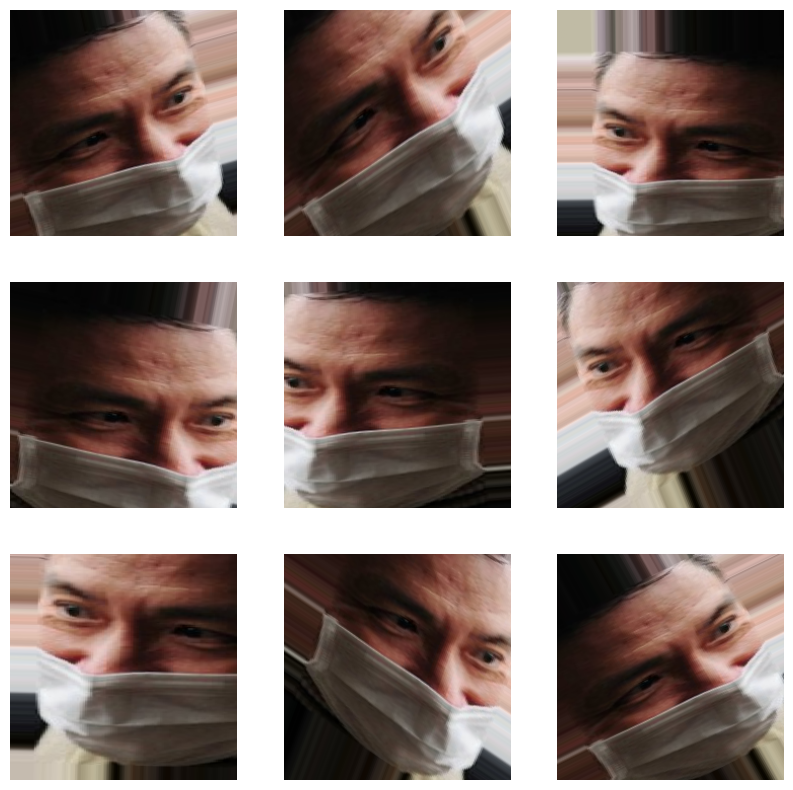

In [33]:
# Load a single image for demonstration
image_path = 'data/with_mask/with_mask_20.jpg'  # Update this path to your image
image = load_img(image_path, target_size=(224, 224))  # Resize image
image_array = img_to_array(image)
image_array = np.expand_dims(image_array, axis=0)  # Add batch dimension

# Generate augmented images
augmented_images = datagen.flow(image_array, batch_size=1)

# Plot augmented images
plt.figure(figsize=(10, 10))
for i in range(9):  # Display 9 augmented images
    plt.subplot(3, 3, i + 1)
    batch = next(augmented_images)  # Generate one augmented image
    img = batch[0]  # Get the first image from the batch
    plt.imshow(img)  # Display the image
    plt.axis('off')  # Hide axes
plt.show()

### 3.5 Data Scaling

In [34]:
# before scaling
X_train[0]

array([[[ 99, 103, 112],
        [ 99, 103, 112],
        [ 98, 102, 111],
        ...,
        [146, 149, 157],
        [148, 151, 158],
        [148, 151, 158]],

       [[ 98, 102, 111],
        [ 98, 102, 111],
        [ 98, 102, 111],
        ...,
        [146, 149, 157],
        [148, 151, 158],
        [148, 151, 158]],

       [[ 97, 101, 110],
        [ 97, 101, 110],
        [ 97, 101, 110],
        ...,
        [146, 149, 157],
        [147, 150, 157],
        [147, 150, 157]],

       ...,

       [[ 14,  12,  13],
        [ 14,  12,  13],
        [ 14,  12,  13],
        ...,
        [ 41,  29,  29],
        [ 40,  28,  28],
        [ 40,  28,  28]],

       [[ 15,  13,  14],
        [ 15,  13,  14],
        [ 15,  13,  14],
        ...,
        [ 41,  29,  29],
        [ 40,  28,  28],
        [ 40,  28,  28]],

       [[ 15,  13,  14],
        [ 15,  13,  14],
        [ 15,  13,  14],
        ...,
        [ 41,  29,  29],
        [ 40,  28,  28],
        [ 40,  28,  28]]

In [35]:
# Normalize the data
X_train = X_train / 255.0
X_valid = X_valid / 255.0
X_test = X_test / 255.0

In [36]:
# after scaling
X_train[0]

array([[[0.38823529, 0.40392157, 0.43921569],
        [0.38823529, 0.40392157, 0.43921569],
        [0.38431373, 0.4       , 0.43529412],
        ...,
        [0.57254902, 0.58431373, 0.61568627],
        [0.58039216, 0.59215686, 0.61960784],
        [0.58039216, 0.59215686, 0.61960784]],

       [[0.38431373, 0.4       , 0.43529412],
        [0.38431373, 0.4       , 0.43529412],
        [0.38431373, 0.4       , 0.43529412],
        ...,
        [0.57254902, 0.58431373, 0.61568627],
        [0.58039216, 0.59215686, 0.61960784],
        [0.58039216, 0.59215686, 0.61960784]],

       [[0.38039216, 0.39607843, 0.43137255],
        [0.38039216, 0.39607843, 0.43137255],
        [0.38039216, 0.39607843, 0.43137255],
        ...,
        [0.57254902, 0.58431373, 0.61568627],
        [0.57647059, 0.58823529, 0.61568627],
        [0.57647059, 0.58823529, 0.61568627]],

       ...,

       [[0.05490196, 0.04705882, 0.05098039],
        [0.05490196, 0.04705882, 0.05098039],
        [0.05490196, 0

## 4. Traditional Machine Learning Model - Random Forest Classifier

Validation Accuracy: 0.8684907325684025
Validation Classification Report:
               precision    recall  f1-score   support

           0       0.84      0.91      0.87       559
           1       0.90      0.83      0.86       574

    accuracy                           0.87      1133
   macro avg       0.87      0.87      0.87      1133
weighted avg       0.87      0.87      0.87      1133



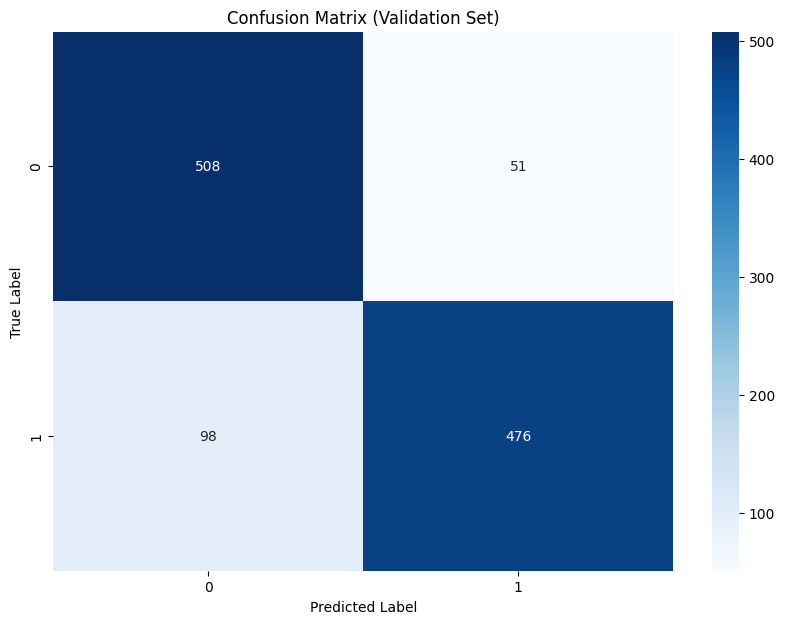

Test Accuracy: 0.8623124448367167
Test Classification Report:
               precision    recall  f1-score   support

           0       0.84      0.89      0.86       559
           1       0.89      0.83      0.86       574

    accuracy                           0.86      1133
   macro avg       0.86      0.86      0.86      1133
weighted avg       0.86      0.86      0.86      1133



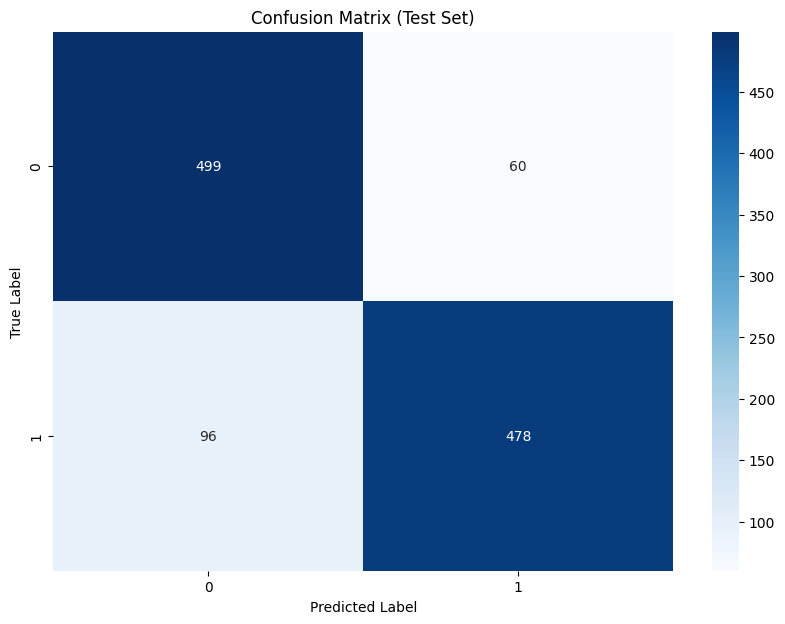

ROC-AUC Score: 0.9423731401893624


In [37]:
# Create and train the Random Forest Classifier
rf_model = RandomForestClassifier(n_estimators=100, random_state=42)
rf_model.fit(X_train_pca, y_train)

# Make predictions
y_valid_pred = rf_model.predict(X_valid_pca)
y_test_pred = rf_model.predict(X_test_pca)

# Evaluate the model
print("Validation Accuracy:", accuracy_score(y_valid, y_valid_pred))

# Print classification reports
print("Validation Classification Report:\n", classification_report(y_valid, y_valid_pred))
# Confusion Matrix for Validation Set
conf_matrix_valid = confusion_matrix(y_valid, y_valid_pred)
plt.figure(figsize=(10, 7))
sns.heatmap(conf_matrix_valid, annot=True, fmt='d', cmap='Blues', xticklabels=np.unique(y_valid), yticklabels=np.unique(y_valid))
plt.title('Confusion Matrix (Validation Set)')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

# Evaluate the model
print("Test Accuracy:", accuracy_score(y_test, y_test_pred))

print("Test Classification Report:\n", classification_report(y_test, y_test_pred))

# Confusion Matrix for Test Set
conf_matrix_test = confusion_matrix(y_test, y_test_pred)
plt.figure(figsize=(10, 7))
sns.heatmap(conf_matrix_test, annot=True, fmt='d', cmap='Blues', xticklabels=np.unique(y_test), yticklabels=np.unique(y_test))
plt.title('Confusion Matrix (Test Set)')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()


# ROC-AUC Score
# For binary classification, you need to get the probabilities
y_test_proba = rf_model.predict_proba(X_test_pca)[:, 1]  # Probability estimates for the positive class
roc_auc = roc_auc_score(y_test, y_test_proba)
print("ROC-AUC Score:", roc_auc)


## 5. Convolutional Neural Network with MobileNetV2

In [38]:
# Load MobileNetV2 pre-trained on ImageNet
base_model = MobileNetV2(weights="imagenet", include_top=False, input_shape=(224, 224, 3))

# Freeze base layers to retain pre-trained weights
base_model.trainable = False

# Add custom layers
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dropout(0.5)(x)
x = Dense(128, activation="relu")(x)
x = Dropout(0.5)(x)
output = Dense(1, activation="sigmoid")(x)

model = Model(inputs=base_model.input, outputs=output)

# Summary
model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1 (Conv2D)      │ (None, 112, 112,  │        864 │ input_layer[0][0] │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ bn_Conv1            │ (None, 112, 112,  │        128 │ Conv1[0][0]       │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1_relu (ReLU)   │ (None, 112, 112,  │          0 │ bn_Conv1[0][0]    │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 112, 112,  │        288 │ Conv1_relu[0][0]  │
│ (DepthwiseConv2D)   │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 112, 112,  │        128 │ expanded_conv_de… │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 112, 112,  │          0 │ expanded_conv_de… │
│ (ReLU)              │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 112, 112,  │        512 │ expanded_conv_de… │
│ (Conv2D)            │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 112, 112,  │         64 │ expanded_conv_pr… │
│ (BatchNormalizatio… │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand      │ (None, 112, 112,  │      1,536 │ expanded_conv_pr… │
│ (Conv2D)            │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_BN   │ (None, 112, 112,  │        384 │ block_1_expand[0… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_relu │ (None, 112, 112,  │          0 │ block_1_expand_B… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_pad         │ (None, 113, 113,  │          0 │ block_1_expand_r… │
│ (ZeroPadding2D)     │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise   │ (None, 56, 56,    │        864 │ block_1_pad[0][0] │
│ (DepthwiseConv2D)   │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 56, 56,    │        384 │ block_1_depthwis… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 56, 56,    │          0 │ block_1_depthwis… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_project     │ (None, 56, 56,    │      2,304 │ block_1_depthwis

 Total params: 2,422,081 (9.24 MB)

 Trainable params: 164,097 (641.00 KB)

 Non-trainable params: 2,257,984 (8.61 MB)

In [39]:
# compile model
model.compile(optimizer='adam',
              loss='binary_crossentropy',
              metrics=['accuracy'])

In [40]:
# Early stopping and learning rate adjustment
early_stopping = EarlyStopping(monitor="val_loss", patience=5, restore_best_weights=True)
reduce_lr = ReduceLROnPlateau(monitor="val_loss", factor=0.5, patience=3, min_lr=1e-6)
checkpoint = ModelCheckpoint("MobileNet.keras", save_best_only=True, monitor="val_loss")

# model training
history = model.fit(
    X_train, y_train, 
    epochs=10, 
    validation_data = (X_valid, y_valid),
    batch_size=32
)

Epoch 1/10
166/166 ━━━━━━━━━━━━━━━━━━━━ 115s 640ms/step - accuracy: 0.9156 - loss: 0.1902 - val_accuracy: 0.9841 - val_loss: 0.0359
Epoch 2/10
166/166 ━━━━━━━━━━━━━━━━━━━━ 102s 616ms/step - accuracy: 0.9841 - loss: 0.0479 - val_accuracy: 0.9868 - val_loss: 0.0341
Epoch 3/10
166/166 ━━━━━━━━━━━━━━━━━━━━ 105s 632ms/step - accuracy: 0.9853 - loss: 0.0447 - val_accuracy: 0.9894 - val_loss: 0.0294
Epoch 4/10
166/166 ━━━━━━━━━━━━━━━━━━━━ 105s 633ms/step - accuracy: 0.9878 - loss: 0.0313 - val_accuracy: 0.9912 - val_loss: 0.0299
Epoch 5/10
166/166 ━━━━━━━━━━━━━━━━━━━━ 104s 626ms/step - accuracy: 0.9912 - loss: 0.0239 - val_accuracy: 0.9912 - val_loss: 0.0266
Epoch 6/10
166/166 ━━━━━━━━━━━━━━━━━━━━ 102s 615ms/step - accuracy: 0.9919 - loss: 0.0289 - val_accuracy: 0.9921 - val_loss: 0.0252
Epoch 7/10
166/166 ━━━━━━━━━━━━━━━━━━━━ 102s 615ms/step - accuracy: 0.9918 - loss: 0.0313 - val_accuracy: 0.9912 - val_loss: 0.0335
Epoch 8/10
166/166 ━━━━━━━━━━━━━━━━━━━━ 101s 608ms/step - accuracy: 0.9901 -

### 5.1 Unfreezing the Layers

In [41]:
# Unfreeze base model
base_model.trainable = True

# Re-compile with a low learning rate
model.compile(optimizer=Adam(learning_rate=0.00001), 
              loss="binary_crossentropy", 
              metrics=["accuracy"])


In [42]:
model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1 (Conv2D)      │ (None, 112, 112,  │        864 │ input_layer[0][0] │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ bn_Conv1            │ (None, 112, 112,  │        128 │ Conv1[0][0]       │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1_relu (ReLU)   │ (None, 112, 112,  │          0 │ bn_Conv1[0][0]    │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 112, 112,  │        288 │ Conv1_relu[0][0]  │
│ (DepthwiseConv2D)   │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 112, 112,  │        128 │ expanded_conv_de… │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 112, 112,  │          0 │ expanded_conv_de… │
│ (ReLU)              │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 112, 112,  │        512 │ expanded_conv_de… │
│ (Conv2D)            │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 112, 112,  │         64 │ expanded_conv_pr… │
│ (BatchNormalizatio… │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand      │ (None, 112, 112,  │      1,536 │ expanded_conv_pr… │
│ (Conv2D)            │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_BN   │ (None, 112, 112,  │        384 │ block_1_expand[0… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_relu │ (None, 112, 112,  │          0 │ block_1_expand_B… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_pad         │ (None, 113, 113,  │          0 │ block_1_expand_r… │
│ (ZeroPadding2D)     │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise   │ (None, 56, 56,    │        864 │ block_1_pad[0][0] │
│ (DepthwiseConv2D)   │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 56, 56,    │        384 │ block_1_depthwis… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 56, 56,    │          0 │ block_1_depthwis… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_project     │ (None, 56, 56,    │      2,304 │ block_1_depthwis

 Total params: 2,422,081 (9.24 MB)

 Trainable params: 2,387,969 (9.11 MB)

 Non-trainable params: 34,112 (133.25 KB)

In [43]:
# Train again (fine-tuning)
history_fine_tune = model.fit(
    X_train, y_train,
    epochs=5,  # Fewer epochs for fine-tuning
    validation_data=(X_valid, y_valid),
    batch_size=32,
    callbacks=[early_stopping, reduce_lr, checkpoint]
)

Epoch 1/5
166/166 ━━━━━━━━━━━━━━━━━━━━ 406s 2s/step - accuracy: 0.8683 - loss: 0.3632 - val_accuracy: 0.9726 - val_loss: 0.0845 - learning_rate: 1.0000e-05
Epoch 2/5
166/166 ━━━━━━━━━━━━━━━━━━━━ 353s 2s/step - accuracy: 0.9544 - loss: 0.1141 - val_accuracy: 0.9762 - val_loss: 0.0628 - learning_rate: 1.0000e-05
Epoch 3/5
166/166 ━━━━━━━━━━━━━━━━━━━━ 348s 2s/step - accuracy: 0.9774 - loss: 0.0628 - val_accuracy: 0.9762 - val_loss: 0.0696 - learning_rate: 1.0000e-05
Epoch 4/5
166/166 ━━━━━━━━━━━━━━━━━━━━ 344s 2s/step - accuracy: 0.9820 - loss: 0.0535 - val_accuracy: 0.9771 - val_loss: 0.0602 - learning_rate: 1.0000e-05
Epoch 5/5
166/166 ━━━━━━━━━━━━━━━━━━━━ 343s 2s/step - accuracy: 0.9906 - loss: 0.0306 - val_accuracy: 0.9753 - val_loss: 0.0597 - learning_rate: 1.0000e-05


### 5.2 Model Evaluation

In [44]:
score = model.evaluate(X_test, y_test)
print(f"Test loss: {score[0]}")
print(f"Test accuracy: {score[1]}")
print('The Loss = ',int(score[0]*100),'%')
print('The Accuracy = ',int(score[1]*100),'%')

36/36 ━━━━━━━━━━━━━━━━━━━━ 15s 414ms/step - accuracy: 0.9761 - loss: 0.0714
Test loss: 0.08397537469863892
Test accuracy: 0.9744042158126831
The Loss =  8 %
The Accuracy =  97 %


### 5.3 Plot the Loss & Accuracy Graph

This is for the initial trainning parts. 

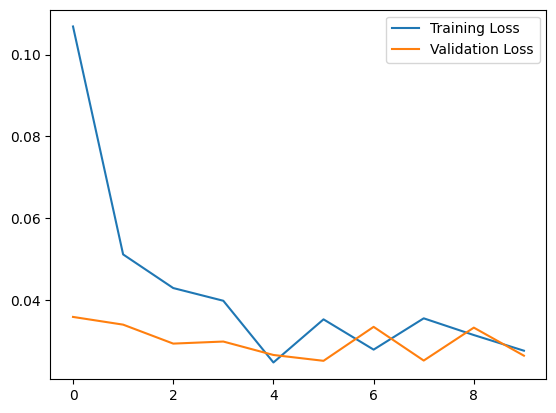

In [46]:
# Plot loss value
plt.plot(history.history['loss'], label="Training Loss")
plt.plot(history.history['val_loss'], label="Validation Loss")
plt.legend()
plt.show()

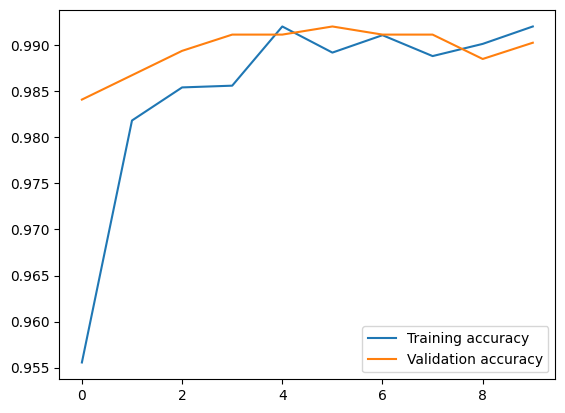

In [47]:
# Plot accuracy value
plt.plot(history.history['accuracy'], label="Training accuracy")
plt.plot(history.history['val_accuracy'], label="Validation accuracy")
plt.legend()
plt.show()

This is for the fine tuning parts.

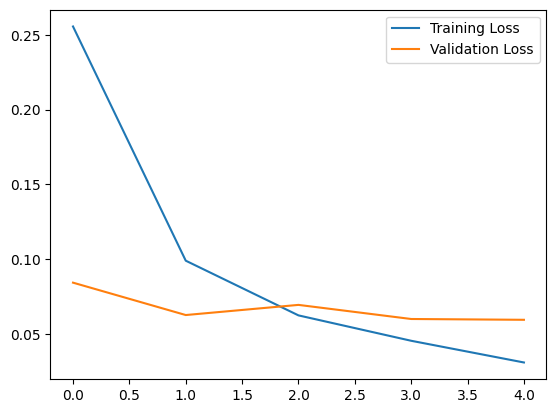

In [48]:
# Plot loss value
plt.plot(history_fine_tune.history['loss'], label="Training Loss")
plt.plot(history_fine_tune.history['val_loss'], label="Validation Loss")
plt.legend()
plt.show()

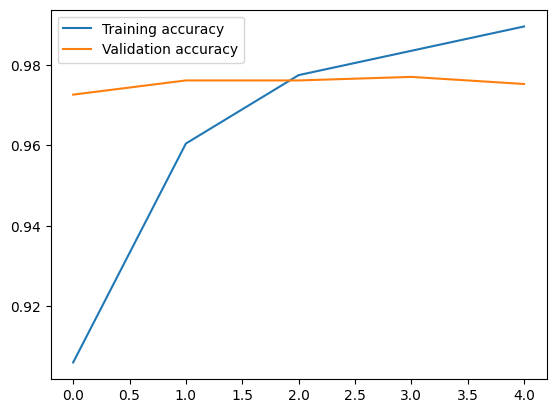

In [50]:
# Plot accuracy value
plt.plot(history_fine_tune.history['accuracy'], label="Training accuracy")
plt.plot(history_fine_tune.history['val_accuracy'], label="Validation accuracy")
plt.legend()
plt.show()

### 5.4 Confusion Matrix & Classification Report & ROC-AUC Score

36/36 ━━━━━━━━━━━━━━━━━━━━ 13s 323ms/step
Validation Confusion Matrix:
 [[558   1]
 [ 27 547]]
Validation Classification Report:
               precision    recall  f1-score   support

           0       0.95      1.00      0.98       559
           1       1.00      0.95      0.98       574

    accuracy                           0.98      1133
   macro avg       0.98      0.98      0.98      1133
weighted avg       0.98      0.98      0.98      1133



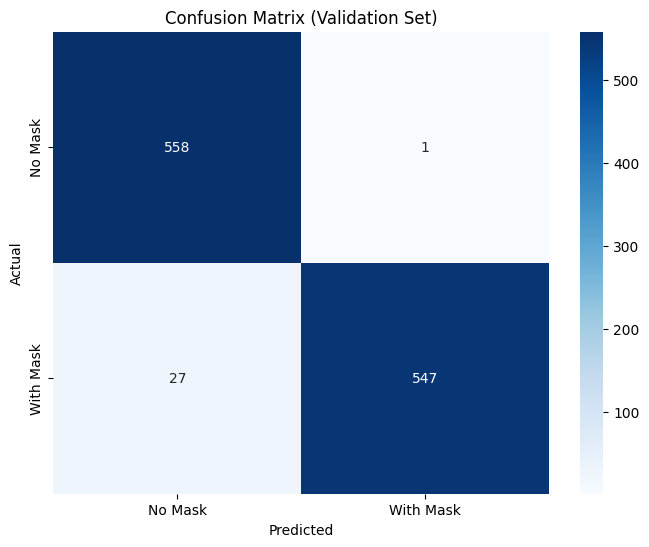

36/36 ━━━━━━━━━━━━━━━━━━━━ 11s 293ms/step
Test Confusion Matrix:
 [[558   1]
 [ 28 546]]
Test Classification Report:
               precision    recall  f1-score   support

           0       0.95      1.00      0.97       559
           1       1.00      0.95      0.97       574

    accuracy                           0.97      1133
   macro avg       0.98      0.97      0.97      1133
weighted avg       0.98      0.97      0.97      1133



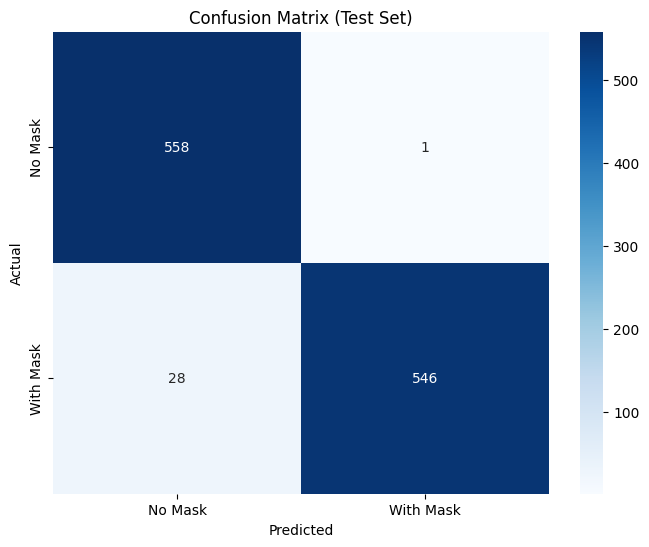

Test ROC-AUC Score: 0.9423731401893624


In [ ]:
# Predictions on validation set
y_valid_pred = model.predict(X_valid)
y_valid_pred = (y_valid_pred > 0.5).astype(int)  # For binary classification

# Compute confusion matrix for validation set
cm_valid = confusion_matrix(y_valid, y_valid_pred)
print("Validation Confusion Matrix:\n", cm_valid)

# Generate classification report for validation set
print("Validation Classification Report:\n", classification_report(y_valid, y_valid_pred))

# Create a heatmap for the validation confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm_valid, annot=True, fmt="d", cmap="Blues", 
            xticklabels=['No Mask', 'With Mask'], 
            yticklabels=['No Mask', 'With Mask'])
plt.title("Confusion Matrix (Validation Set)")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()

# Predictions on test set
y_test_pred = model.predict(X_test)
y_test_pred = (y_test_pred > 0.5).astype(int)  # For binary classification

# Compute confusion matrix for test set
cm_test = confusion_matrix(y_test, y_test_pred)
print("Test Confusion Matrix:\n", cm_test)

# Generate classification report for test set
print("Test Classification Report:\n", classification_report(y_test, y_test_pred))

# Create a heatmap for the test confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm_test, annot=True, fmt="d", cmap="Blues", 
            xticklabels=['No Mask', 'With Mask'], 
            yticklabels=['No Mask', 'With Mask'])
plt.title("Confusion Matrix (Test Set)")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()

# ROC-AUC Score
# For binary classification, you need to get the probabilities
y_test_proba = rf_model.predict_proba(X_test_pca)[:, 1]  # Probability estimates for the positive class
# Compute ROC-AUC score for test set
roc_auc_test = roc_auc_score(y_test, y_test_proba)
print("Test ROC-AUC Score:", roc_auc_test)


### 5.5 Model Saving

In [52]:
model.save("model.keras")

### 5.6. Prediction of Images 
the images I have created to predict the face mask 

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


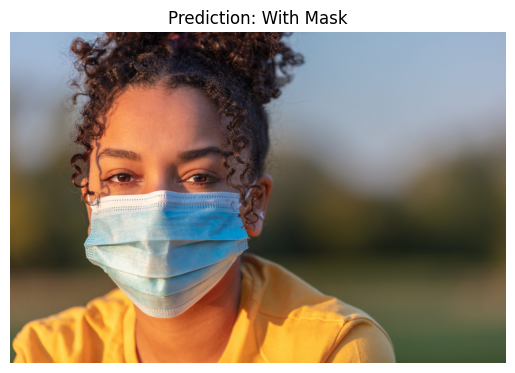

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


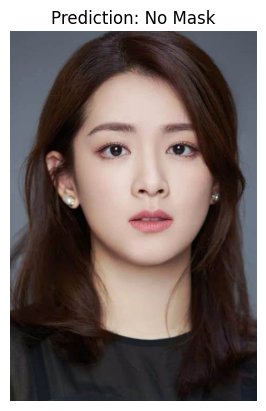

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


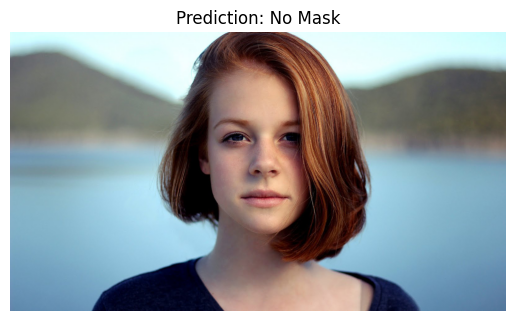

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


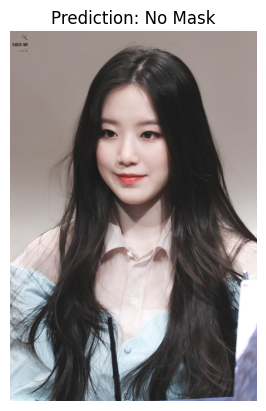

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step


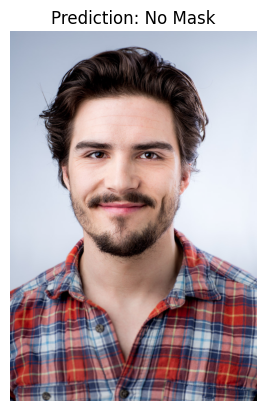

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step


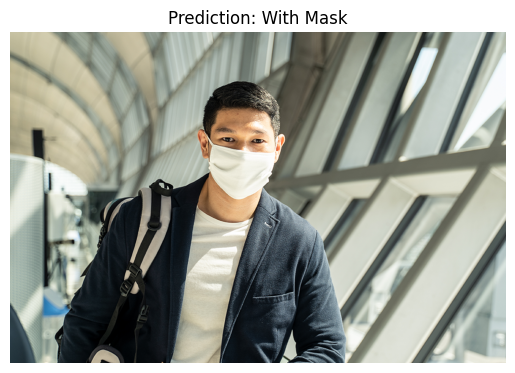

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


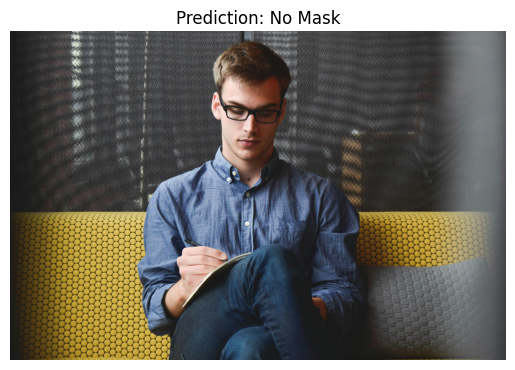

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


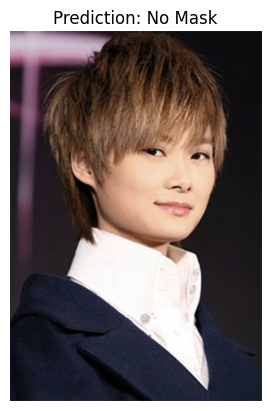

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


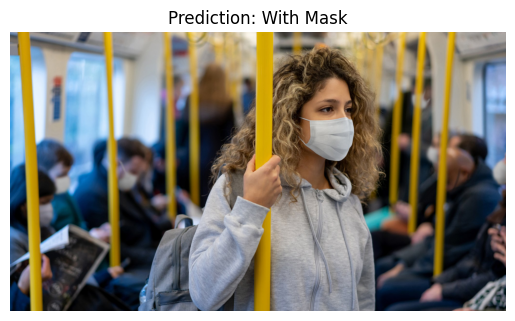

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


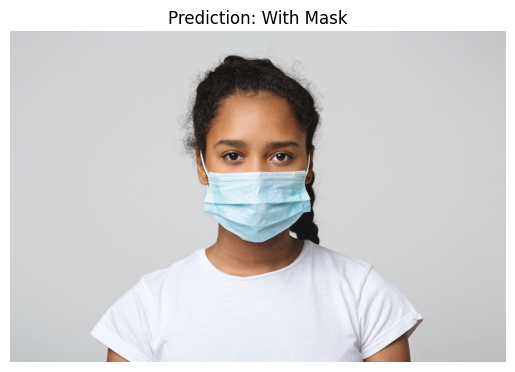

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


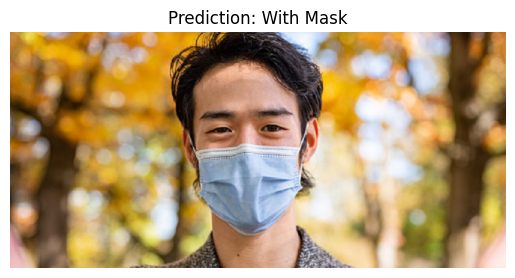

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


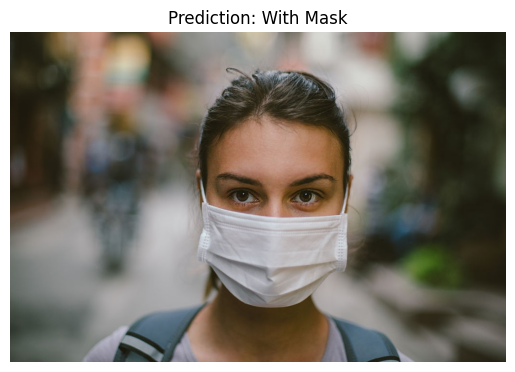

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


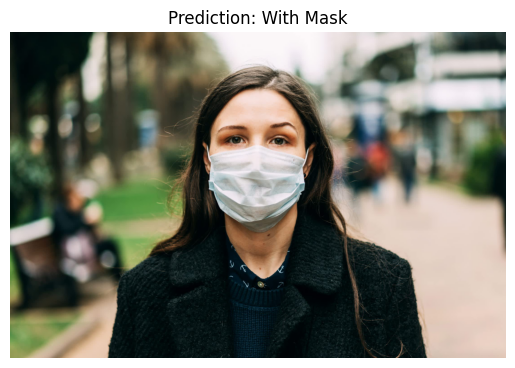

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


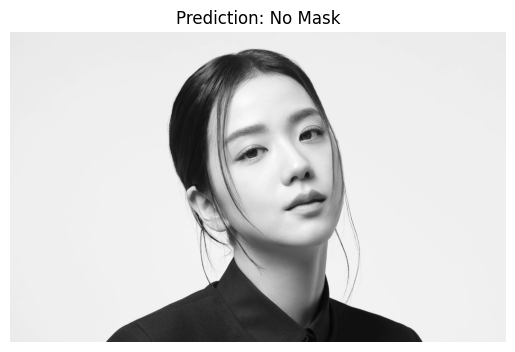

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step


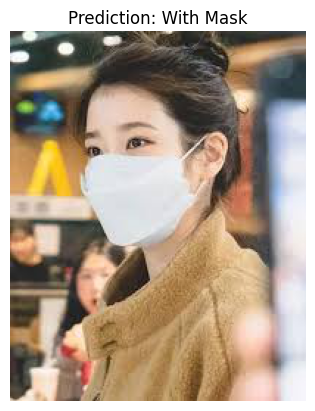

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


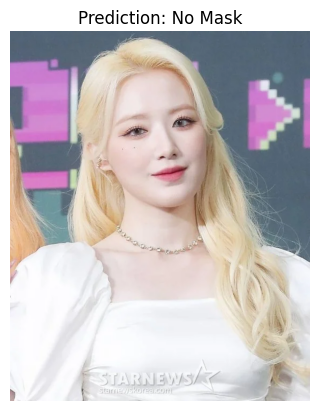

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


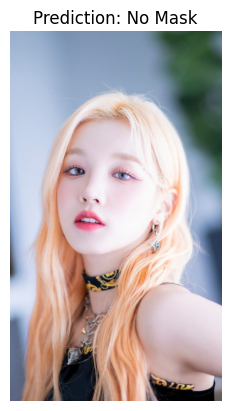

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


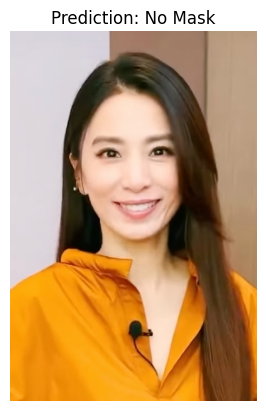

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


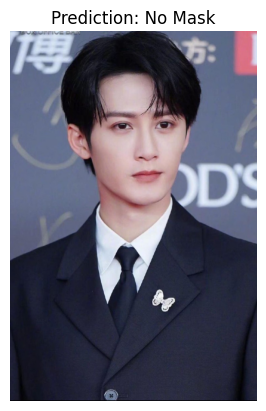

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


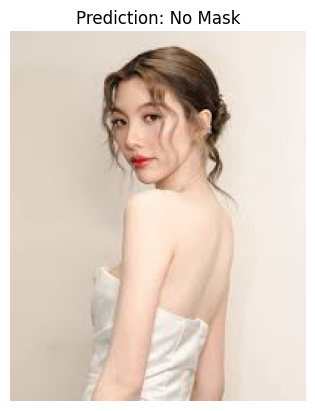

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


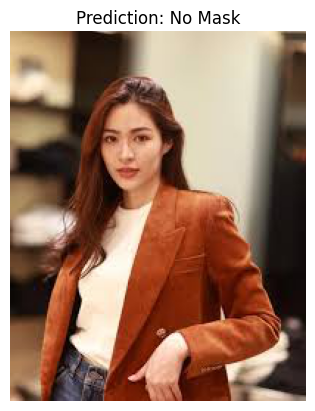

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


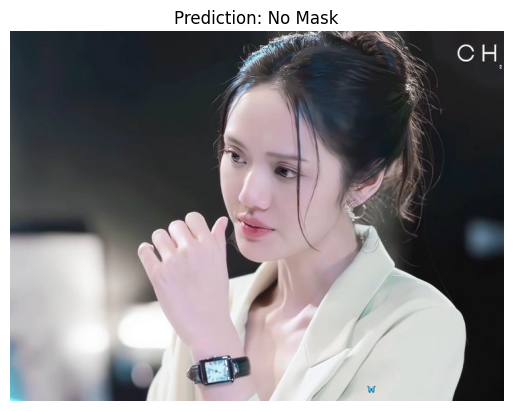

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


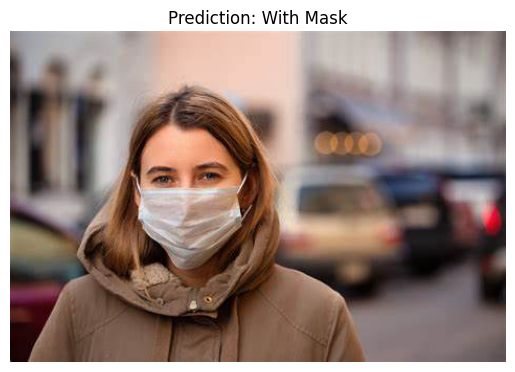

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


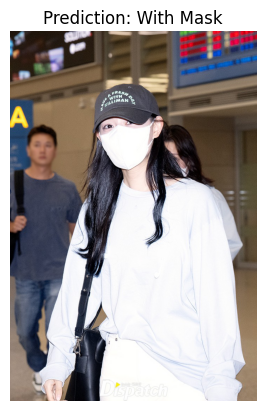

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


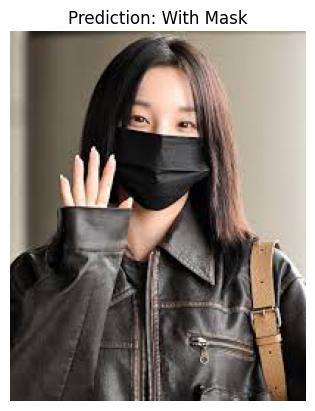

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


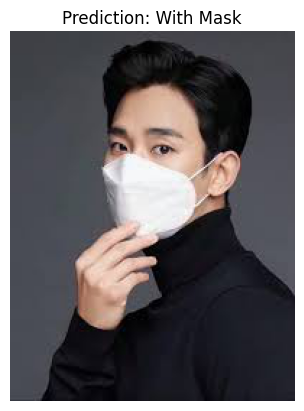

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


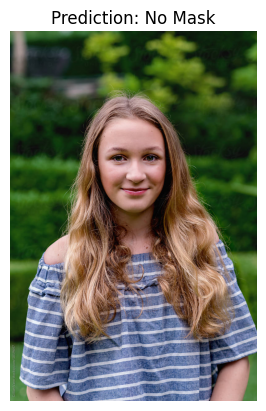

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


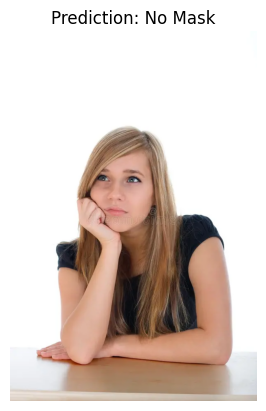

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


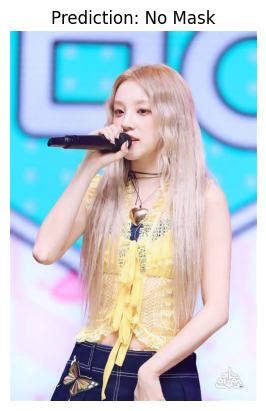

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


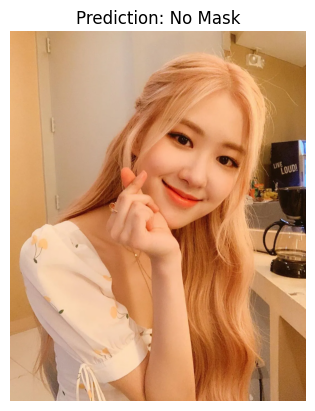

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


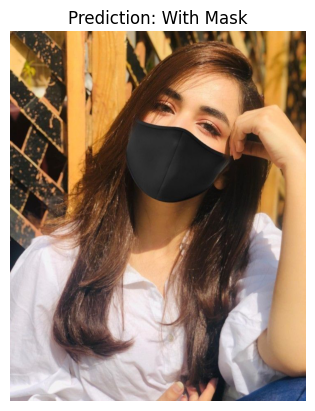

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


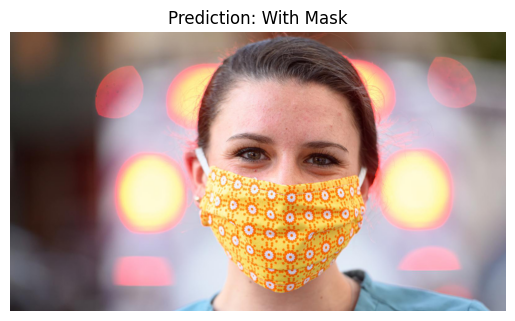

In [53]:
# Load the trained model
model = load_model('model.keras')

def preprocess_image(image_path, target_size=(224, 224)):
    """
    Load and preprocess the image for prediction.
    
    Parameters:
    - image_path: str, path to the image file
    - target_size: tuple, target size for the model input
    
    Returns:
    - image: numpy array, preprocessed image
    """
    image = load_img(image_path, target_size=target_size)  # Load the image
    image = img_to_array(image)  # Convert to array
    image = np.expand_dims(image, axis=0)  # Add batch dimension
    image = image / 255.0  # Normalize to [0, 1]
    return image

# Directory containing images
image_folder = "images/"  # Update this with your folder path

# Loop through all images in the folder
for image_file in os.listdir(image_folder):
    if image_file.endswith(('.jpg', '.jpeg', '.png')):  # Check for image file types
        image_path = os.path.join(image_folder, image_file)  # Get full image path
        test_image = preprocess_image(image_path)  # Preprocess the image
        prediction = model.predict(test_image)  # Make prediction

        # Interpret the prediction
        if prediction[0][0] > 0.5:
            prediction_text = "No Mask"
        else:
            prediction_text = "With Mask"

        # Display the image and prediction
        plt.imshow(load_img(image_path))  # Load the original image for display
        plt.title(f"Prediction: {prediction_text}")  # Set the title with prediction
        plt.axis('off')  # Hide axes
        plt.show()  # Show the image